## DAP Multi-Readout Grid Search (Forced Continuous)

Use this section to decode `DAP/cDAP_pools_data_subtract_bin10.csv` with **forced continuous mode** and **grid search enabled**.

All generated files are written into the `DAP` folder.

In [15]:
import os
import sys
import shlex
import pandas as pd

def find_project_root(start_dir: str) -> str:
    cur = os.path.abspath(start_dir)
    for _ in range(8):
        has_script = os.path.exists(os.path.join(cur, "decode_N.py"))
        has_dap = os.path.isdir(os.path.join(cur, "DAP"))
        if has_script and has_dap:
            return cur
        parent = os.path.dirname(cur)
        if parent == cur:
            break
        cur = parent
    raise FileNotFoundError(
        "Could not locate project root containing decode_N.py and DAP/. "
        f"Start dir was: {start_dir}"
    )

# Resolve project and DAP paths robustly
working_dir = find_project_root(os.getcwd())
dap_dir = os.path.join(working_dir, "DAP")
script_path = os.path.join(working_dir, "decode_N.py")
path_to_WA = os.path.join(dap_dir, "binary_pooling.csv")
readout_raw = os.path.join(dap_dir, "cDAP_pools_data_subtract_bin10.csv")

# Grid-search decode settings
differentiate = 1
diluting = True
force_continuous = True
grid_search = True
return_all_fits = True
save_grid_decoders = True
grid_objective = "mse"  # options: mse, mae, rmse, r2

# Optional row windows for speed-up (1-based, inclusive).
# Pairwise slicing is used: row_a[i] -> row_b[i].
# Example: row_a=[1, 100], row_b=[20, 180] keeps rows 1..20 and 100..180.
# Set both to None to keep all rows.
row_a = 421260#[105424, 115608, 421260]#None
row_b = 422633# [109188, 116939, 422633]#None

python_executable = sys.executable

for required in [script_path, path_to_WA, readout_raw, dap_dir]:
    if not os.path.exists(required):
        raise FileNotFoundError(f"Required path not found: {required}")

# Determine pool width from WA
wa_df = pd.read_csv(path_to_WA, index_col=0)
n_pools = wa_df.shape[1]

# Read raw readout and clean empty rows/cols
raw_df = pd.read_csv(readout_raw, dtype=str)
raw_df = raw_df.dropna(axis=0, how="all").dropna(axis=1, how="all")
total_rows_before = len(raw_df)

# Optional pairwise row subsetting to speed up preparation/decoding
if row_a is None and row_b is None:
    start_row = 1
    end_row = total_rows_before
    ranges_used = [f"{start_row}:{end_row}"]
elif row_a is None or row_b is None:
    raise ValueError("row_a and row_b must both be None or both be set.")
else:
    row_a_list = list(row_a) if isinstance(row_a, (list, tuple)) else [row_a]
    row_b_list = list(row_b) if isinstance(row_b, (list, tuple)) else [row_b]

    if len(row_a_list) != len(row_b_list):
        raise ValueError(
            f"row_a and row_b must have the same length. Got {len(row_a_list)} and {len(row_b_list)}."
        )
    if len(row_a_list) == 0:
        raise ValueError("row_a and row_b cannot be empty when provided.")

    pieces = []
    ranges_used = []
    for idx, (a_raw, b_raw) in enumerate(zip(row_a_list, row_b_list)):
        a_val = int(a_raw)
        b_val = int(b_raw)
        if a_val < 1:
            raise ValueError(f"row_a[{idx}] must be >= 1, got {a_val}")
        if b_val < a_val:
            raise ValueError(
                f"row_b[{idx}] must be >= row_a[{idx}], got row_a[{idx}]={a_val}, row_b[{idx}]={b_val}"
            )
        if b_val > total_rows_before:
            raise ValueError(
                f"row_b[{idx}] ({b_val}) exceeds available rows ({total_rows_before}) after cleaning"
            )
        pieces.append(raw_df.iloc[a_val - 1:b_val])
        ranges_used.append(f"{a_val}:{b_val}")

    raw_df = pd.concat(pieces, axis=0, ignore_index=True)
    start_row = min(int(x) for x in row_a_list)
    end_row = max(int(x) for x in row_b_list)

# If first column is fully non-numeric and width matches n_pools + 1, treat it as existing ID
first_col_numeric = pd.to_numeric(raw_df.iloc[:, 0], errors="coerce").notna().all() if raw_df.shape[1] > 0 else False
has_id_col = raw_df.shape[1] == (n_pools + 1) and not first_col_numeric

if has_id_col:
    prepared_df = raw_df.copy()
else:
    # No ID column detected: use first n_pools columns as data and prepend readout_id
    data_df = raw_df.copy()
    if data_df.shape[1] > n_pools:
        data_df = data_df.iloc[:, :n_pools]
    elif data_df.shape[1] < n_pools:
        raise ValueError(
            f"Readout has too few columns ({data_df.shape[1]}); expected at least {n_pools} numeric pool columns."
        )

    prepared_df = data_df.copy()
    prepared_df.insert(0, "readout_id", [f"cDAP_{i + 1}" for i in range(len(prepared_df))])

# Save manipulated/validated file in DAP folder
readout_prepared = os.path.join(dap_dir, "cDAP_pools_data_subtract_bin10_prepared.csv")
prepared_df.to_csv(readout_prepared, index=False)

cmd = [
    python_executable,
    script_path,
    "--path_to_WA", path_to_WA,
    "--readout", readout_prepared,
    "--differentiate", str(differentiate),
    "--diluting", "True" if diluting else "False",
    "--force_continuous", "True" if force_continuous else "False",
    "--grid_search", "True" if grid_search else "False",
    "--return_all_fits", "True" if return_all_fits else "False",
    "--save_grid_decoders", "True" if save_grid_decoders else "False",
    "--grid_objective", grid_objective,
]

print("Configuration:")
print("=" * 70)
print(f"Working dir:         {working_dir}")
print(f"DAP dir:             {dap_dir}")
print(f"decode_N.py:         {script_path}")
print(f"WA matrix:           {path_to_WA}")
print(f"Readout raw:         {readout_raw}")
print(f"Readout prepared:    {readout_prepared}")
print(f"n_pools (from WA):   {n_pools}")
print(f"Ranges selected:     {', '.join(ranges_used)}")
print(f"Rows kept (final):   {len(raw_df)} out of {total_rows_before}")
print(f"Detected ID column:  {has_id_col}")
print(f"Differentiate:       {differentiate}")
print(f"Force continuous:    {force_continuous}")
print(f"Grid search:         {grid_search}")
print(f"Save grid decoders:  {save_grid_decoders}")
print(f"Grid objective:      {grid_objective}")
print(f"Python executable:   {python_executable}")
print("=" * 70)

print("\nPrepared command (run next cell to execute):")
print(" ".join(shlex.quote(c) for c in cmd))

Configuration:
Working dir:         /Users/ltalamanca/My Drive/Git/PoolPy
DAP dir:             /Users/ltalamanca/My Drive/Git/PoolPy/DAP
decode_N.py:         /Users/ltalamanca/My Drive/Git/PoolPy/decode_N.py
WA matrix:           /Users/ltalamanca/My Drive/Git/PoolPy/DAP/binary_pooling.csv
Readout raw:         /Users/ltalamanca/My Drive/Git/PoolPy/DAP/cDAP_pools_data_subtract_bin10.csv
Readout prepared:    /Users/ltalamanca/My Drive/Git/PoolPy/DAP/cDAP_pools_data_subtract_bin10_prepared.csv
n_pools (from WA):   4
Ranges selected:     421260:422633
Rows kept (final):   1374 out of 464166
Detected ID column:  False
Differentiate:       1
Force continuous:    True
Grid search:         True
Save grid decoders:  True
Grid objective:      mse
Python executable:   /Users/ltalamanca/uv_2/bin/python

Prepared command (run next cell to execute):
/Users/ltalamanca/uv_2/bin/python '/Users/ltalamanca/My Drive/Git/PoolPy/decode_N.py' --path_to_WA '/Users/ltalamanca/My Drive/Git/PoolPy/DAP/binary_pool

In [16]:
# Check how often all channels are 0 in the readout
import os
import pandas as pd

# Reuse variables from setup cell when available
readout_path = os.path.join(os.getcwd(), "DAP", "cDAP_pools_data_subtract_bin10_prepared.csv")
df_local = pd.read_csv(readout_path, dtype=str)
df_local = df_local.dropna(axis=0, how="all").dropna(axis=1, how="all")

channel_df = df_local.iloc[:, 1:5].copy()

channel_num = channel_df.apply(pd.to_numeric, errors="coerce")
valid_rows = channel_num.notna().all(axis=1)
all_zero_mask = valid_rows & (channel_num.eq(0).all(axis=1))

n_total = len(channel_num)
n_valid = int(valid_rows.sum())
n_all_zero = int(all_zero_mask.sum())
pct_total = (100.0 * n_all_zero / n_total) if n_total > 0 else 0.0
pct_valid = (100.0 * n_all_zero / n_valid) if n_valid > 0 else 0.0

print("All-zero channel readout summary")
print("=" * 70)
print(f"Readout file:              {readout_path}")
print(f"Rows after clean:          {n_total}")
print(f"Rows with numeric channels:{n_valid}")
print(f"Rows with all channels=0:  {n_all_zero}")
print(f"Percent of all rows:       {pct_total:.4f}%")
print(f"Percent of valid rows:     {pct_valid:.4f}%")
print("=" * 70)

All-zero channel readout summary
Readout file:              /Users/ltalamanca/My Drive/Git/PoolPy/DAP/cDAP_pools_data_subtract_bin10_prepared.csv
Rows after clean:          1374
Rows with numeric channels:1374
Rows with all channels=0:  415
Percent of all rows:       30.2038%
Percent of valid rows:     30.2038%


In [17]:
# Run decode script (separate execution cell)
import subprocess

res = subprocess.run(
    cmd,
    cwd=dap_dir,
    capture_output=True,
    text=True,
    check=False,
    timeout=60000,
 )

print("Exit code:", res.returncode)
if res.stdout:
    print("\nSTDOUT:\n" + res.stdout.strip())
if res.stderr:
    print("\nSTDERR:\n" + res.stderr.strip())

Exit code: 0

STDERR:
/Users/ltalamanca/uv_2/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
Linear regression models with a zero l1 penalization strength are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/Users/ltalamanca/uv_2/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
Linear regression models with a zero l1 penalization strength are more efficiently fitted using one of the solvers implemente

In [18]:
# Preview grid-search outputs generated in DAP/
decoded_grid_csv = os.path.join(dap_dir, "decoded_grid.csv")
decoded_grid_decoders_csv = os.path.join(dap_dir, "decoded_grid_decoders.csv")

if os.path.exists(decoded_grid_csv):
    print(f"Found: {decoded_grid_csv}")
    grid_df = pd.read_csv(decoded_grid_csv)
    print(f"Rows: {len(grid_df)}")
    print("\nPreview of decoded_grid.csv")
    print("-" * 70)
    print(grid_df.head(5).to_string(index=False))
else:
    print(f"Missing: {decoded_grid_csv}")

if os.path.exists(decoded_grid_decoders_csv):
    print(f"\nFound: {decoded_grid_decoders_csv}")
    dec_df = pd.read_csv(decoded_grid_decoders_csv)
    print(f"Rows: {len(dec_df)}")
    print("\nPreview of decoded_grid_decoders.csv")
    print("-" * 70)
    print(dec_df.head(10).to_string(index=False))
else:
    print(f"\nMissing: {decoded_grid_decoders_csv}")

Found: /Users/ltalamanca/My Drive/Git/PoolPy/DAP/decoded_grid.csv
Rows: 1374

Preview of decoded_grid.csv
----------------------------------------------------------------------
readout_id Decoded Type                          Decoder Output  Grid Search Alpha  Grid Search L1 Ratio  Grid Search Total Score Grid Search Objective
    cDAP_1   continuous 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0              0.001                   1.0                  0.00075                   mse
    cDAP_2   continuous 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0              0.001                   1.0                  0.00075                   mse
    cDAP_3   continuous 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0              0.001                   1.0                  0.00075                   mse
    cDAP_4   continuous 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0              0.001                   1.0                  0.00075                   mse
    cDAP_5   continuous 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0

Decoded vs experimental correlation summary
TF raw file:            /Users/ltalamanca/My Drive/Git/PoolPy/DAP/cDAP_TF_single_data_subtract_bin10.csv
TF prepared file:       /Users/ltalamanca/My Drive/Git/PoolPy/DAP/cDAP_TF_single_data_subtract_bin10_prepared.csv
Ranges used:            421260:422633
Decoded grid decoders:  /Users/ltalamanca/My Drive/Git/PoolPy/DAP/decoded_grid_decoders.csv
Correlation CSV:        /Users/ltalamanca/My Drive/Git/PoolPy/DAP/decoded_vs_tf_grid_correlation_concat.csv
Grid points evaluated:  90
 alpha  l1_ratio  pearson_corr  matched_readouts
 0.001      0.00      0.353219                10
 0.001      0.05      0.353203                10
 0.001      0.10      0.352135                10
 0.001      0.20      0.353345                10
 0.001      0.50      0.384818                10
 0.001      0.80      0.301892                10
 0.001      0.90      0.255549                10
 0.001      0.95      0.256527                10
 0.001      1.00      0.255983 

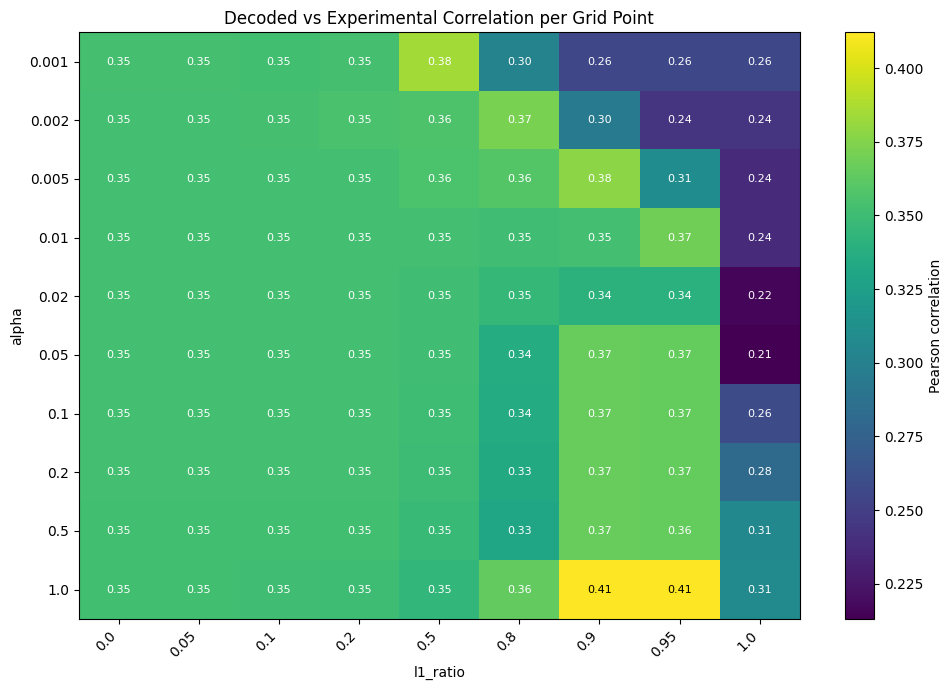

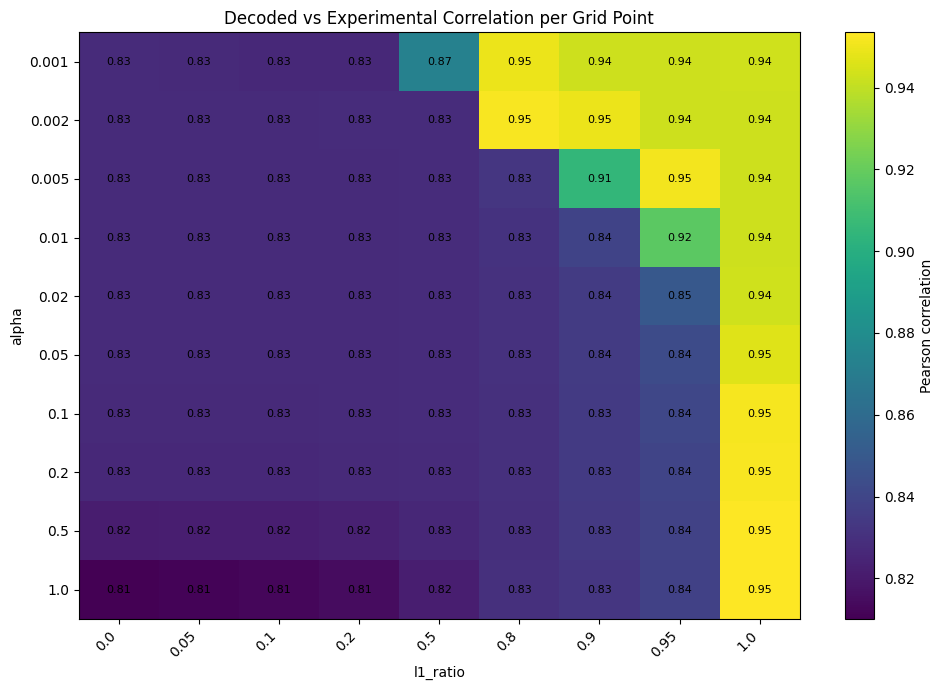

In [ ]:
# Compare decoded vs experimental (TF single) per grid point and plot heatmap
import os
import ast
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Paths
tf_raw_path = os.path.join(dap_dir, "cDAP_TF_single_data_subtract_bin10.csv")
tf_prepared_path = os.path.join(dap_dir, "cDAP_TF_single_data_subtract_bin10_prepared.csv")
decoded_grid_decoders_csv = os.path.join(dap_dir, "decoded_grid_decoders.csv")

if not os.path.exists(decoded_grid_decoders_csv):
    raise FileNotFoundError(
        f"Missing {decoded_grid_decoders_csv}. Run with grid_search=True and save_grid_decoders=True first."
    )
if not os.path.exists(tf_raw_path):
    raise FileNotFoundError(f"Missing experimental file: {tf_raw_path}")

# Number of compounds expected in decoded vectors
n_compounds = wa_df.shape[0]

# Load and clean TF-single file
tf_raw_df = pd.read_csv(tf_raw_path, dtype=str)
tf_raw_df = tf_raw_df.dropna(axis=0, how="all").dropna(axis=1, how="all")
tf_total_rows = len(tf_raw_df)

# Apply the same row filtering used for readout preparation
if row_a is None and row_b is None:
    tf_ranges_used = [f"1:{tf_total_rows}"]
    tf_filtered_df = tf_raw_df.copy()
elif row_a is None or row_b is None:
    raise ValueError("row_a and row_b must both be None or both be set.")
else:
    row_a_list = list(row_a) if isinstance(row_a, (list, tuple)) else [row_a]
    row_b_list = list(row_b) if isinstance(row_b, (list, tuple)) else [row_b]
    if len(row_a_list) != len(row_b_list):
        raise ValueError(
            f"row_a and row_b must have the same length. Got {len(row_a_list)} and {len(row_b_list)}."
        )

    tf_parts = []
    tf_ranges_used = []
    for idx, (a_raw, b_raw) in enumerate(zip(row_a_list, row_b_list)):
        a_val = int(a_raw)
        b_val = int(b_raw)
        if a_val < 1:
            raise ValueError(f"row_a[{idx}] must be >= 1, got {a_val}")
        if b_val < a_val:
            raise ValueError(
                f"row_b[{idx}] must be >= row_a[{idx}], got row_a[{idx}]={a_val}, row_b[{idx}]={b_val}"
            )
        if b_val > tf_total_rows:
            raise ValueError(
                f"row_b[{idx}] ({b_val}) exceeds TF rows ({tf_total_rows}) after cleaning"
            )
        tf_parts.append(tf_raw_df.iloc[a_val - 1:b_val])
        tf_ranges_used.append(f"{a_val}:{b_val}")
    tf_filtered_df = pd.concat(tf_parts, axis=0, ignore_index=True)

# Detect and normalize TF data shape to [readout_id + n_compounds columns]
tf_first_col_numeric = pd.to_numeric(tf_filtered_df.iloc[:, 0], errors="coerce").notna().all() if tf_filtered_df.shape[1] > 0 else False
tf_has_id_col = tf_filtered_df.shape[1] == (n_compounds + 1) and not tf_first_col_numeric

if tf_has_id_col:
    tf_prepared_df = tf_filtered_df.copy()
else:
    tf_data_df = tf_filtered_df.copy()
    if tf_data_df.shape[1] > n_compounds:
        tf_data_df = tf_data_df.iloc[:, :n_compounds]
    elif tf_data_df.shape[1] < n_compounds:
        raise ValueError(
            f"TF file has too few columns ({tf_data_df.shape[1]}); expected at least {n_compounds}."
        )
    tf_prepared_df = tf_data_df.copy()
    tf_prepared_df.insert(0, "readout_id", [f"cDAP_{i + 1}" for i in range(len(tf_prepared_df))])

# Save prepared TF file with ID column
tf_prepared_df.to_csv(tf_prepared_path, index=False)

# Load decoded per-grid outputs
decoders_df = pd.read_csv(decoded_grid_decoders_csv)

# Ensure numeric alpha/l1_ratio
decoders_df["alpha"] = pd.to_numeric(decoders_df["alpha"], errors="coerce")
decoders_df["l1_ratio"] = pd.to_numeric(decoders_df["l1_ratio"], errors="coerce")
decoders_df = decoders_df.dropna(subset=["alpha", "l1_ratio", "readout_id", "decoder_output"])

# Build experimental lookup by readout_id
tf_numeric = tf_prepared_df.copy()
for col in tf_numeric.columns[1:]:
    tf_numeric[col] = pd.to_numeric(tf_numeric[col], errors="coerce")
tf_numeric = tf_numeric.dropna(axis=0, how="any")

exp_lookup = {
    str(row["readout_id"]): row.iloc[1:].to_numpy(dtype=float)
    for _, row in tf_numeric.iterrows()
}

def parse_decoder_vector(val):
    if isinstance(val, list):
        return np.array(val, dtype=float)
    if isinstance(val, str):
        parsed = ast.literal_eval(val)
        return np.array(parsed, dtype=float)
    return np.array(val, dtype=float)

# Correlation per (alpha, l1_ratio) by flattening all matched rows
corr_rows = []
corr_rows_flat=[]
for (alpha, l1_ratio), grp in decoders_df.groupby(["alpha", "l1_ratio"]):
    dec_list = []
    exp_list = []
    for _, r in grp.iterrows():
        rid = str(r["readout_id"])

        if rid not in exp_lookup:
            continue
        dec_vec = parse_decoder_vector(r["decoder_output"])
        exp_vec = exp_lookup[rid]
        m = min(len(dec_vec), len(exp_vec))
        if m == 0:
            continue
        dec_list.append(dec_vec[:m])
        exp_list.append(exp_vec[:m])

    x_ls=[]
    y_ls=[]

    if len(dec_list) == 0:
        corr = np.nan
        n_pairs = 0


    else:
        j=0
        corr=0

        for i in range(np.array(dec_list).shape[1]):
            x=np.array(dec_list)[:,i]
            y=np.array(exp_list)[:,i]
            if np.sum(x)==0 or np.sum(y)==0:
                continue
            j+=1
            corr+= float(np.corrcoef(x, y)[0, 1])

            if True:
                x_ls.extend(list(x))
                y_ls.extend(list(y))
                corr_ls=float(np.corrcoef(x_ls, y_ls)[0, 1])

    corr_rows.append({
        "alpha": float(alpha),
        "l1_ratio": float(l1_ratio),
        "pearson_corr": corr/j,
        "matched_readouts": j,
    })
    corr_rows_flat.append({
        "alpha": float(alpha),
        "l1_ratio": float(l1_ratio),
        "pearson_corr": corr_ls,
    })

corr_df = pd.DataFrame(corr_rows).sort_values(["alpha", "l1_ratio"])
corr_csv_path = os.path.join(dap_dir, "decoded_vs_tf_grid_correlation.csv")
corr_df.to_csv(corr_csv_path, index=False)

corr_df_long = pd.DataFrame(corr_rows_flat).sort_values(["alpha", "l1_ratio"])
corr_csv_path = os.path.join(dap_dir, "decoded_vs_tf_grid_correlation_concat.csv")
corr_df_long.to_csv(corr_csv_path, index=False)

heat_dir=os.path.join(dap_dir, "heatmap_corr.svg")

# Heatmap: rows=alpha, cols=l1_ratio, values=pearson_corr
heat = corr_df.pivot(index="alpha", columns="l1_ratio", values="pearson_corr").sort_index().sort_index(axis=1)

plt.figure(figsize=(10, 7))
plt.imshow(heat.values, aspect="auto", interpolation="nearest")
plt.colorbar(label="Pearson correlation")
plt.title("Decoded vs Experimental Correlation per Grid Point")
plt.xlabel("l1_ratio")
plt.ylabel("alpha")
plt.xticks(ticks=np.arange(len(heat.columns)), labels=[str(c) for c in heat.columns], rotation=45, ha="right")
plt.yticks(ticks=np.arange(len(heat.index)), labels=[str(i) for i in heat.index])

# Annotate cells with correlation values
for i in range(heat.shape[0]):
    for j in range(heat.shape[1]):
        val = heat.iloc[i, j]
        txt = "nan" if pd.isna(val) else f"{val:.2f}"
        plt.text(j, i, txt, ha="center", va="center", color="white" if not pd.isna(val) and val < 0.4 else "black", fontsize=8)

plt.tight_layout()
plt.savefig(heat_dir)
plt.show()

heat_dir=os.path.join(dap_dir, "heatmap_corr_concat.svg")
# Heatmap: rows=alpha, cols=l1_ratio, values=pearson_corr
heat = corr_df_long.pivot(index="alpha", columns="l1_ratio", values="pearson_corr").sort_index().sort_index(axis=1)

plt.figure(figsize=(10, 7))
plt.imshow(heat.values, aspect="auto", interpolation="nearest")
plt.colorbar(label="Pearson correlation")
plt.title("Decoded vs Experimental Correlation per Grid Point")
plt.xlabel("l1_ratio")
plt.ylabel("alpha")
plt.xticks(ticks=np.arange(len(heat.columns)), labels=[str(c) for c in heat.columns], rotation=45, ha="right")
plt.yticks(ticks=np.arange(len(heat.index)), labels=[str(i) for i in heat.index])

# Annotate cells with correlation values
for i in range(heat.shape[0]):
    for j in range(heat.shape[1]):
        val = heat.iloc[i, j]
        txt = "nan" if pd.isna(val) else f"{val:.2f}"
        plt.text(j, i, txt, ha="center", va="center", color="white" if not pd.isna(val) and val < 0.4 else "black", fontsize=8)

plt.tight_layout()
plt.savefig(heat_dir)
plt.show()